In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("ticks")

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)

from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessor

%matplotlib inline

In [18]:
dp = DataPreprocessor(drop_HS=True)
data = dp.preprocess_data("data_final.csv")

INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Dropping Healthcare Infection Control
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Performing Smoothing
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Albania
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Andorra
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Estonia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Iceland
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Latvia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Lithuania
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing New Zealand
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Singapore
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Skipping smoothing Slovakia
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Performing Masking


In [21]:
data.filter_region_min_deaths(100)

Region AL removed since it has 27.0 deaths on the last day
Region AD removed since it has 40.0 deaths on the last day
Region BA removed since it has 57.0 deaths on the last day
Region BG removed since it has 55.0 deaths on the last day
Region HR removed since it has 54.0 deaths on the last day
Region EE removed since it has 46.0 deaths on the last day
Region IS removed since it has 10.0 deaths on the last day
Region LV removed since it has 12.0 deaths on the last day
Region LT removed since it has 41.0 deaths on the last day
Region MY removed since it has 98.0 deaths on the last day
Region NZ removed since it has 18.0 deaths on the last day
Region SG removed since it has 12.0 deaths on the last day
Region SK removed since it has 17.0 deaths on the last day
Region SI removed since it has 81.0 deaths on the last day
Region ZA removed since it has 86.0 deaths on the last day


In [25]:
import random

In [29]:
random.shuffle(data.Rs)

In [34]:
with cm_effect.models.CMCombined_Final_V3(data, None) as model:
    model.build_model()

In [36]:
with model.model:
        model.trace = pm.sample(20, chains=2, target_accept=0.95)

Only 20 samples in chain.
Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 4 jobs)
NUTS: [InitialSizeDeaths_log, Phi_1, InitialSizeCases_log, ExpectedLogRDeaths, ExpectedLogRCases, RegionLogR, HyperRVar, HyperRMean, CM_Alpha]
INFO:pymc3:NUTS: [InitialSizeDeaths_log, Phi_1, InitialSizeCases_log, ExpectedLogRDeaths, ExpectedLogRCases, RegionLogR, HyperRVar, HyperRMean, CM_Alpha]
Sampling 2 chains, 0 divergences: 100%|██████████| 1040/1040 [12:39<00:00,  1.37draws/s]
/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/pymc3/sampling.py:496: UserWarning: The number of samples is too small to check convergence reliably.
  warnings.warn("The number of samples is too small to check convergence reliably.")


In [23]:
len(data.Rs)

24

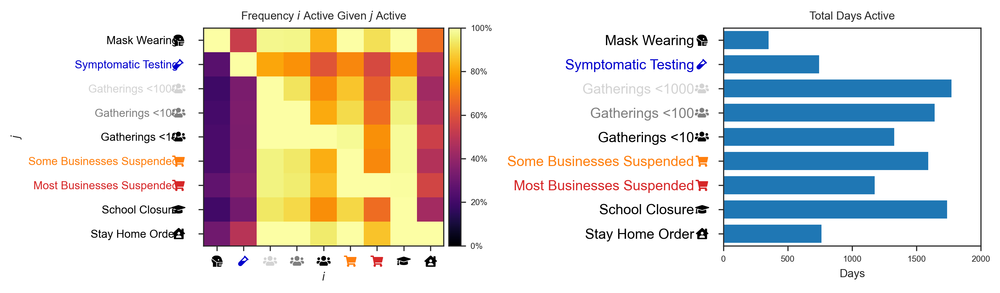

In [4]:
cm_plot_style = [
#             ("\uf7f2", "tab:red"), # hospital symbol
            ("\uf963", "black"), # mask
            ("\uf492", "mediumblue"), # vial
            ("\uf0c0", "lightgrey"), # ppl
            ("\uf0c0", "grey"), # ppl
            ("\uf0c0", "black"), # ppl
            ("\uf07a", "tab:orange"), # shop 1
            ("\uf07a", "tab:red"), # shop2 
            ("\uf19d", "black"), # school
            ("\uf965", "black") # home
        ]
data.summary_plot(cm_plot_style)

In [8]:
with cm_effect.models.CMCombined_Final(data, cm_plot_style) as model:
    model.build_model()

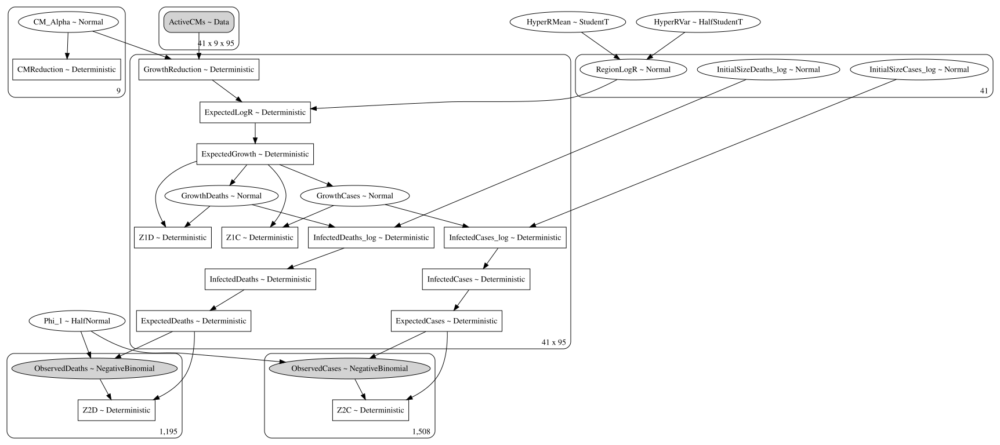

In [32]:
pm.model_to_graphviz(model).render("model-combined-final")
pm.model_to_graphviz(model)

In [33]:
with model.model:
    model.trace = pm.sample(2000, chains=4, cores=4, target_accept=0.975)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [InitialSizeDeaths_log, Phi_1, InitialSizeCases_log, GrowthDeaths, GrowthCases, RegionLogR, HyperRVar, HyperRMean, CM_Alpha]
INFO:pymc3:NUTS: [InitialSizeDeaths_log, Phi_1, InitialSizeCases_log, GrowthDeaths, GrowthCases, RegionLogR, HyperRVar, HyperRMean, CM_Alpha]
Sampling 4 chains, 0 divergences: 100%|██████████| 10000/10000 [3:38:01<00:00,  1.31s/draws] 
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree dep

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;15-13


200.0


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;15-13


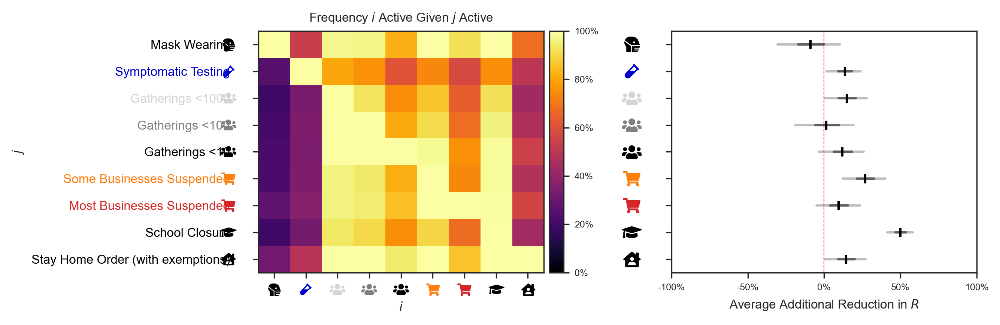

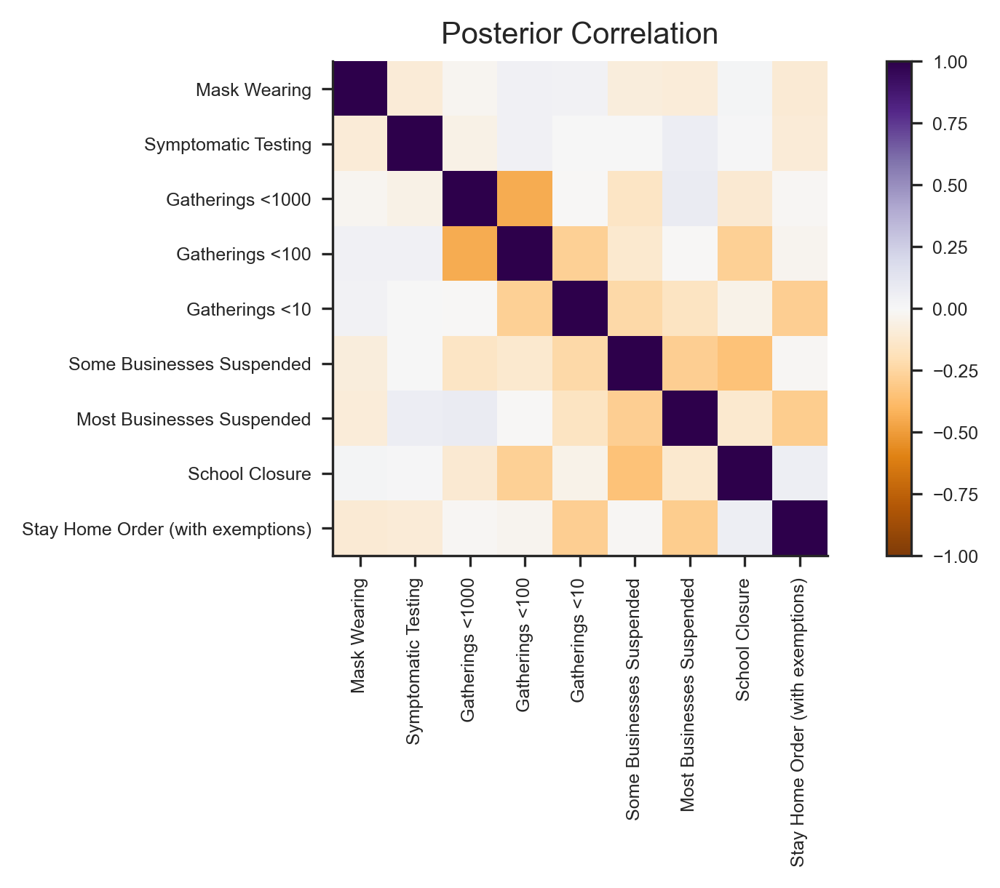

In [34]:
model.plot_effect(model.cm_plot_style)

In [35]:
import pickle

pickle.dump(model.trace, open("combined-journal.pkl", "wb"))

In [14]:
import pickle

trace = pickle.load(open("combined-journal.pkl", "rb"))

In [17]:
trace.varnames

['CM_Alpha',
 'HyperRMean',
 'HyperRVar_log__',
 'RegionLogR',
 'GrowthCases',
 'GrowthDeaths',
 'InitialSizeCases_log',
 'Phi_1_log__',
 'InitialSizeDeaths_log',
 'CMReduction',
 'HyperRVar',
 'GrowthReduction',
 'ExpectedLogR',
 'ExpectedGrowth',
 'Z1C',
 'Z1D',
 'InfectedCases_log',
 'InfectedCases',
 'ExpectedCases',
 'Phi_1',
 'Z2C',
 'InfectedDeaths_log',
 'InfectedDeaths',
 'ExpectedDeaths',
 'Z2D']

In [16]:
trace.Phi_1

array([62.06768268, 59.69285088, 58.55262573, ..., 61.94777722,
       59.44279559, 60.93408194])

In [12]:
indxs = [data.Rs.index(r) for r in ["LT", "BG", "IL", "SK", "SG", "AD", "MX"]]

In [13]:
np.exp(np.mean(trace["RegionLogR"], axis=0))[indxs]

array([4.00640973, 4.18110143, 3.86282466, 4.05654704, 3.03587284,
       2.71054228, 4.30585403])

In [36]:
CMRed = np.loadtxt("combined2805.txt")

derived_features = [ #()"Healthcare Infection Control", [0]),
 ("Mask Wearing*    ", [1-1]),
 ("Symptomatic Testing    ", [2-1]),
 ("Gatherings <1000     ", [3-1]),
 ("Gatherings <100           ", [3-1, 4-1]),
 ("Gatherings <10                 ", [3-1, 4-1, 5-1]),
 ("Some Businesses     \nSuspended          ", [6-1]),
 ("Most Businesses           \nSuspended               ", [6-1, 7-1]),
 ("School Closure     ", [8-1]),
 ("Stay Home Order     \n (with exemptions)     ", [9-1]),  
 ]

nS, _ = CMRed.shape
CMRed_d = np.zeros((nS, len(derived_features)))

for f_i, (f, prodrows) in enumerate(derived_features):
    s = np.ones(nS)
    for r in prodrows:
        s = s * CMRed[:, r] 
    CMRed_d[:, f_i] = s

CMRed_d = 100*(1-CMRed_d)
for i, f in enumerate(data.CMs):
    print(f"{f} mean:{np.mean(CMRed_d[:, i]):.2f} med:{np.median(CMRed_d[:, i]):.2f} std:{np.std(CMRed_d[:, i]):.2f} [{np.percentile(CMRed_d[:, i], 2.5):.2f} .. {np.median(CMRed_d[:, i]):.2f} ..  {np.percentile(CMRed_d[:, i], 97.5):.2f}] Credence Positive: {100*np.mean(CMRed_d[:, i] > 0):.2f}%")

Mask Wearing mean:-8.89 med:-8.28 std:12.98 [-36.07 .. -8.28 ..  14.32] Credence Positive: 25.15%
Symptomatic Testing mean:13.42 med:13.73 std:6.67 [-0.58 .. 13.73 ..  25.54] Credence Positive: 97.02%
Gatherings <1000 mean:15.81 med:16.29 std:8.48 [-1.94 .. 16.29 ..  31.08] Credence Positive: 96.24%
Gatherings <100 mean:16.79 med:17.22 std:9.66 [-3.33 .. 17.22 ..  34.79] Credence Positive: 95.25%
Gatherings <10 mean:27.97 med:28.57 std:9.53 [7.55 .. 28.57 ..  44.92] Credence Positive: 99.65%
Some Businesses Suspended mean:26.25 med:26.82 std:8.69 [8.26 .. 26.82 ..  42.17] Credence Positive: 99.67%
Most Businesses Suspended mean:33.58 med:34.11 std:8.40 [15.95 .. 34.11 ..  48.70] Credence Positive: 99.96%
School Closure mean:49.69 med:49.93 std:5.20 [38.92 .. 49.93 ..  59.15] Credence Positive: 100.00%
Stay Home Order (with exemptions) mean:14.06 med:14.35 std:7.96 [-2.16 .. 14.35 ..  28.71] Credence Positive: 95.40%


In [19]:
np.mean(model.trace["CM_Alpha"], axis=0)

array([-0.00689035,  0.20347563,  0.07760688,  0.02224598,  0.18276554,
        0.21813612,  0.05170507,  0.85505293,  0.17723381])

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;16-01


200.0


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;16-01


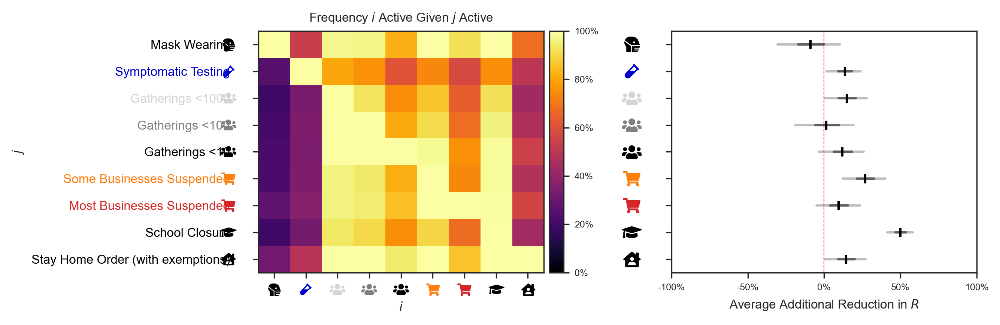

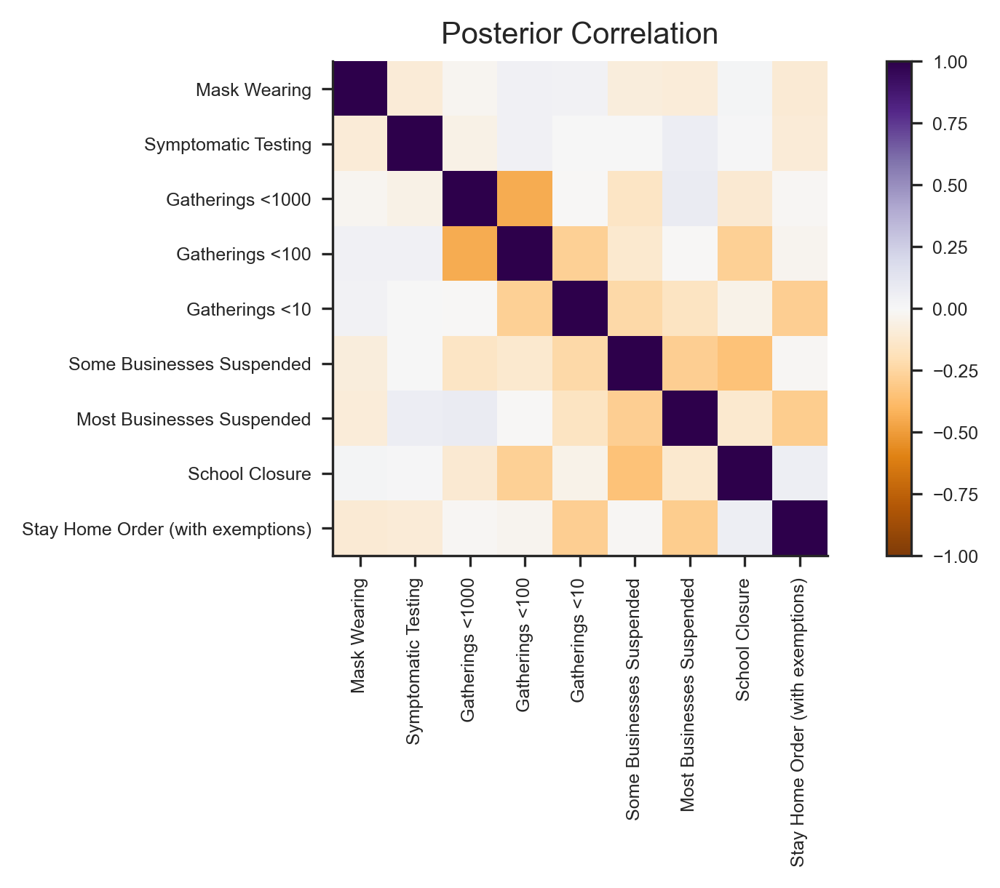

In [37]:
model.plot_effect()

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 31-05;20-07
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 31-05;20-07


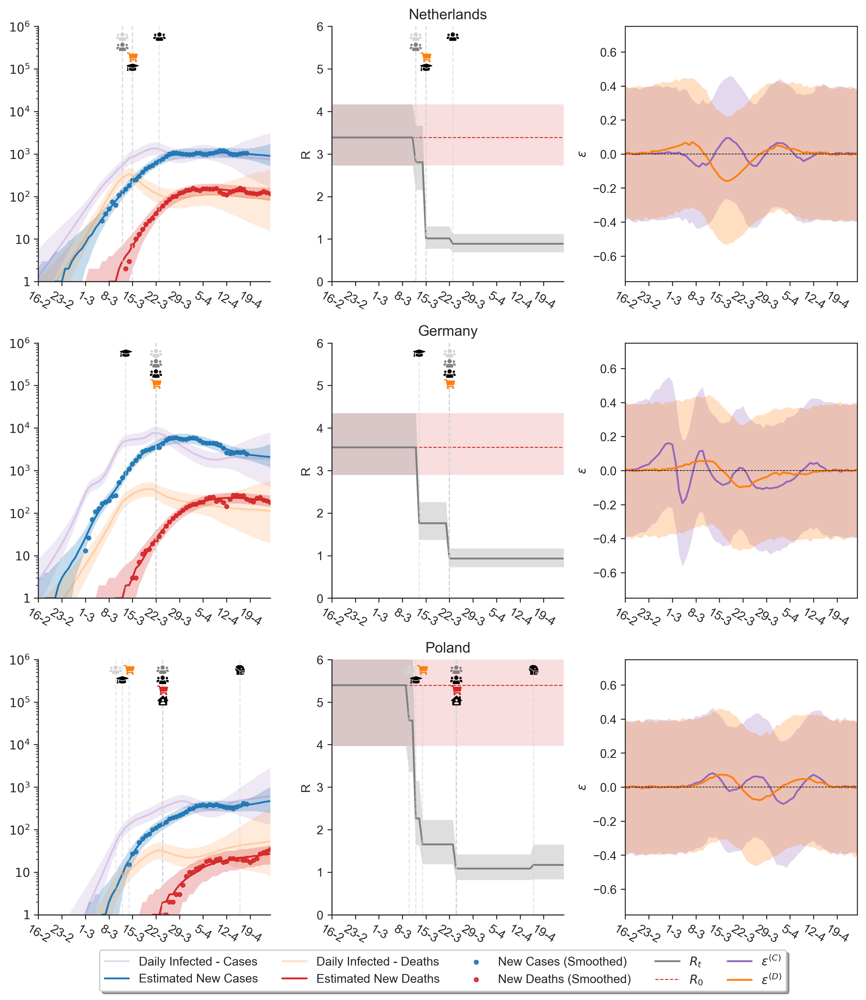

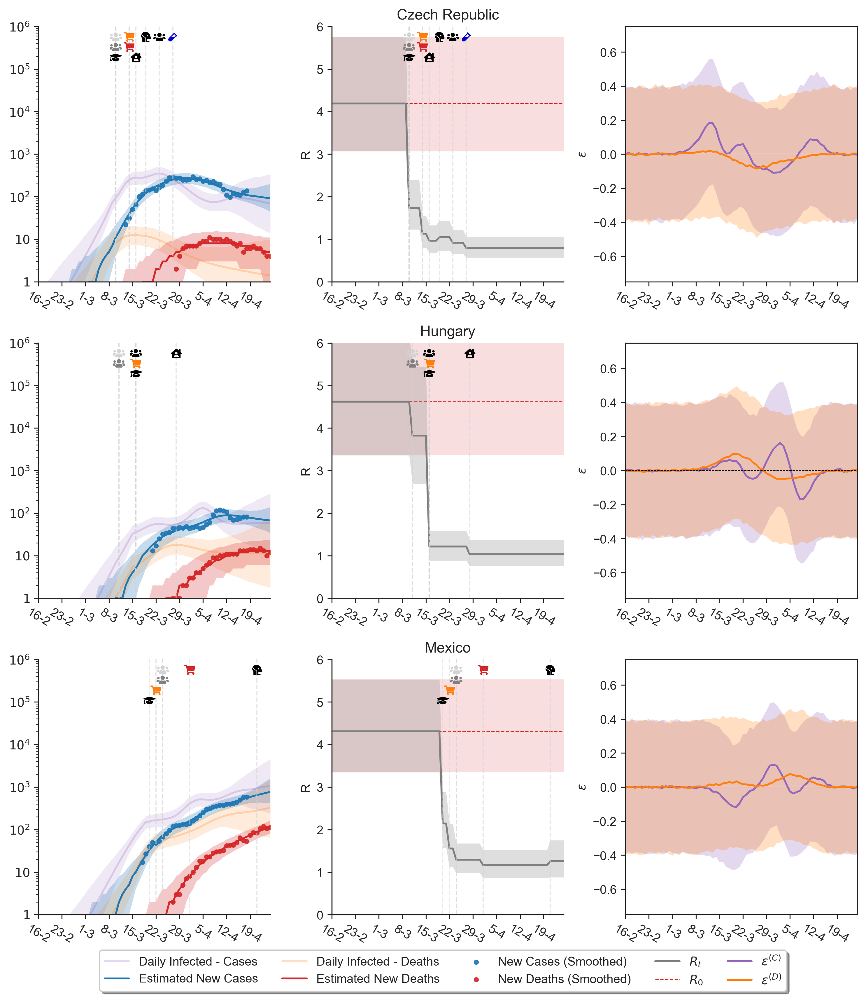

In [10]:
regions = ["NL", "DE", "PL", "CZ", "HU", "MX"]
r_i = [data.Rs.index(r) for r in regions]
model.trace = trace
model.plot_subset_region_predictions(r_i, model.cm_plot_style)

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-48
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-48
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-49


hi?
GE


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-49
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-49


hi?
MT


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-49
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-50
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-50
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-50
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-50
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 30-05;17-50


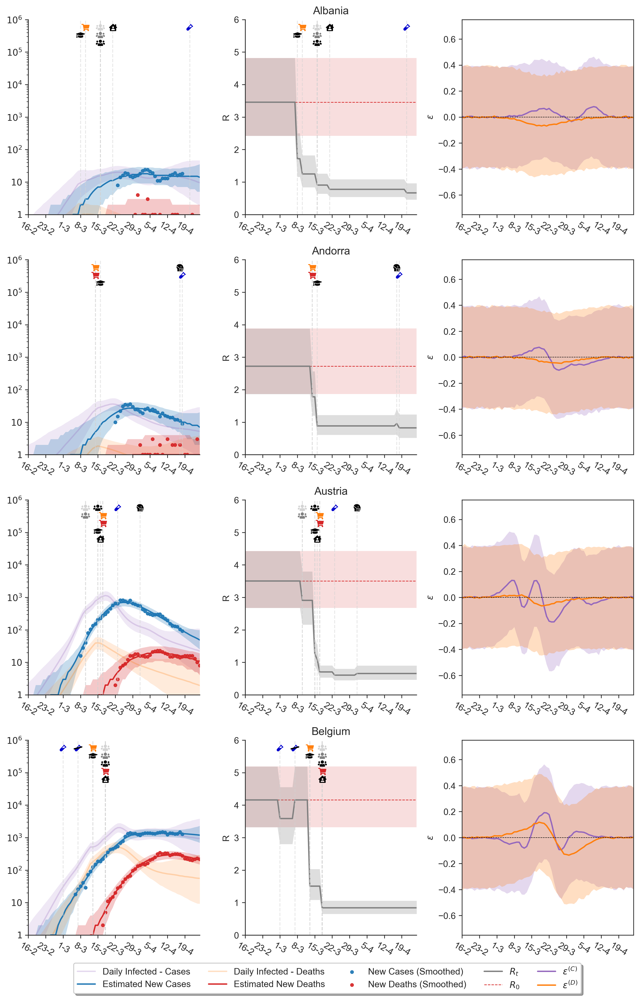

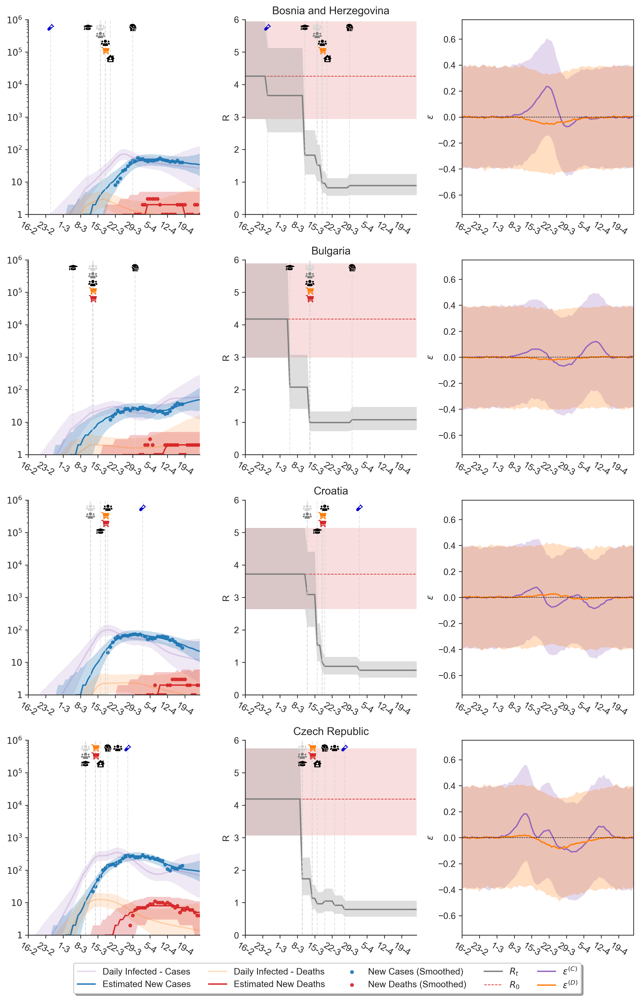

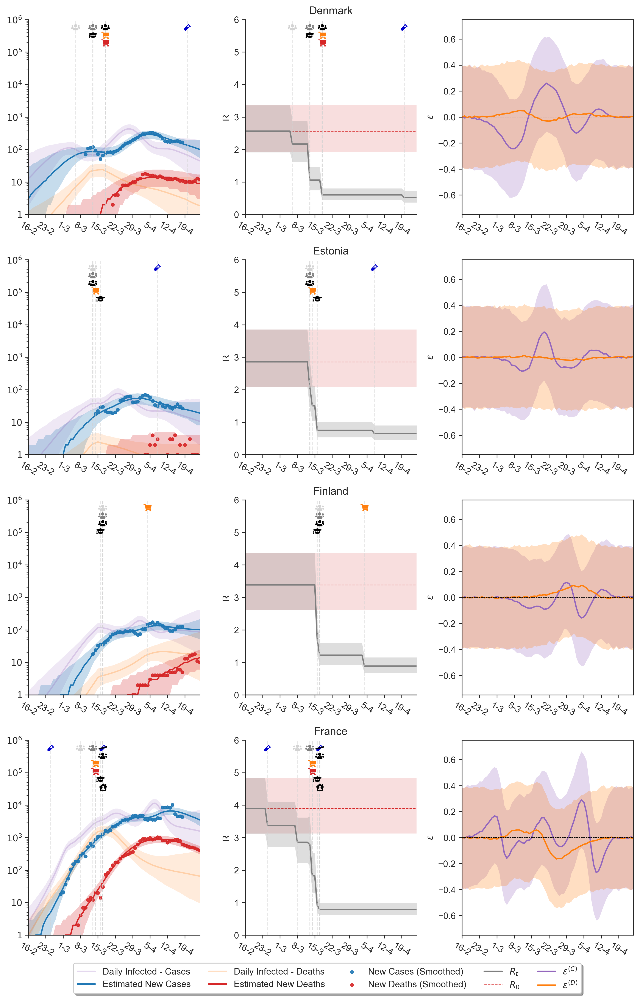

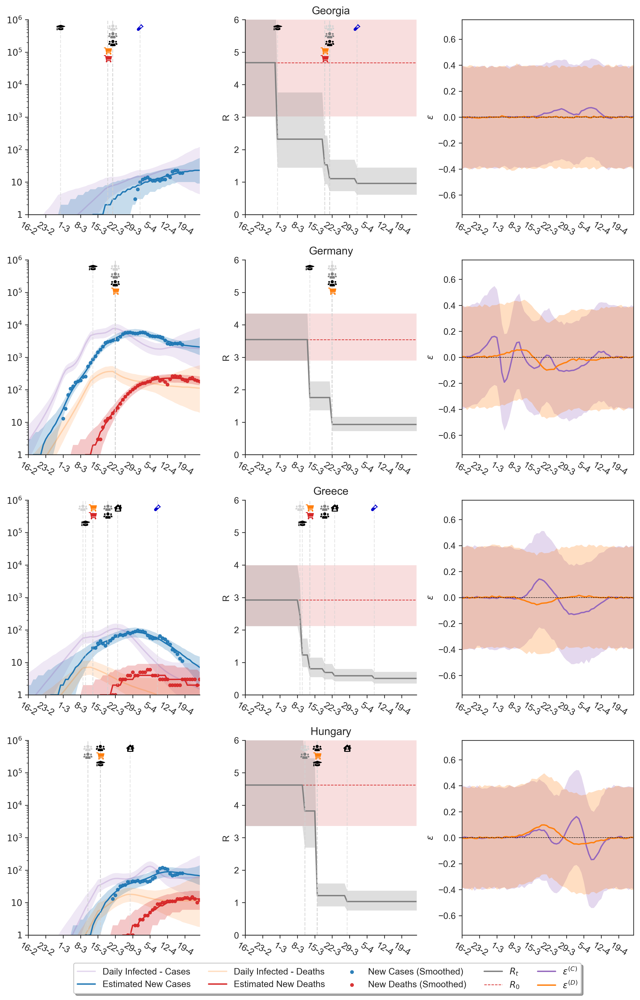

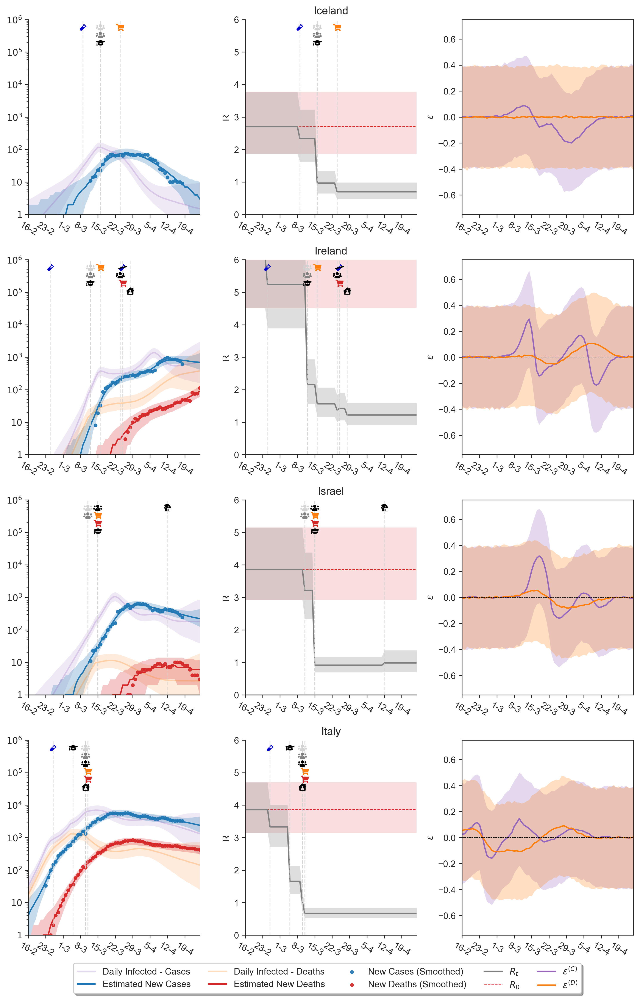

...

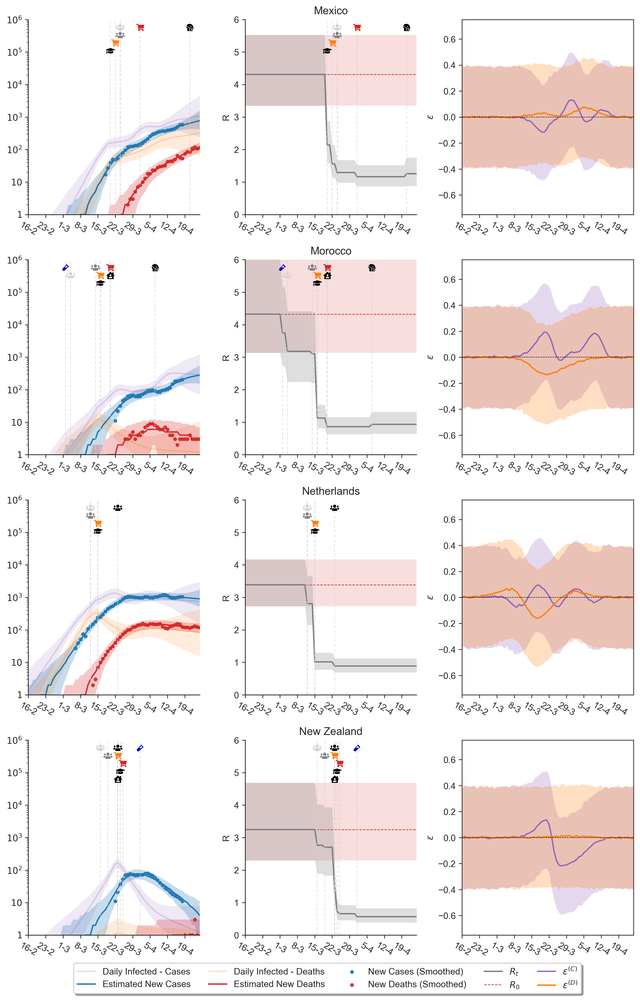

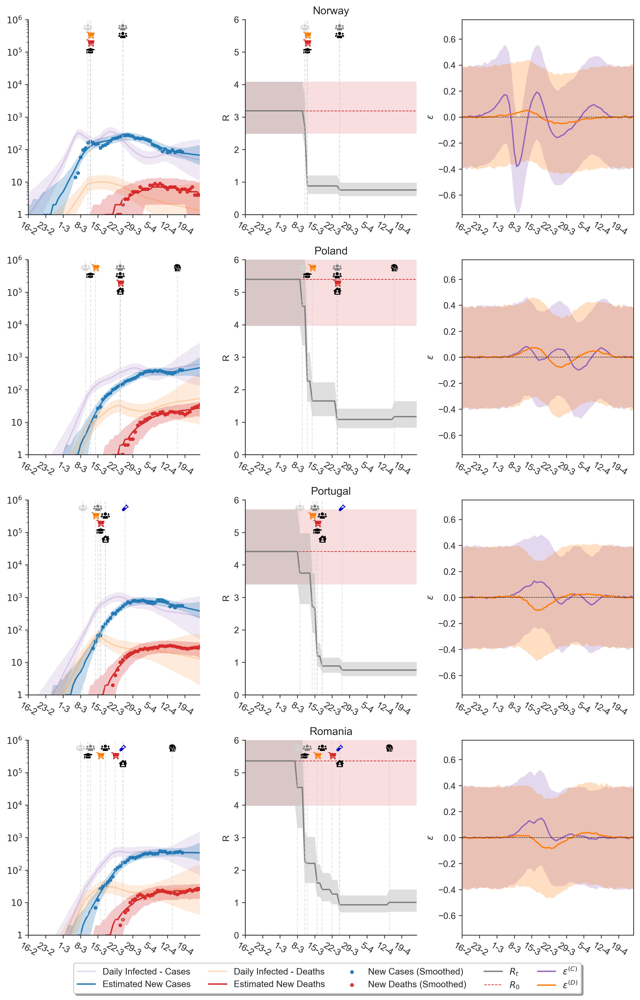

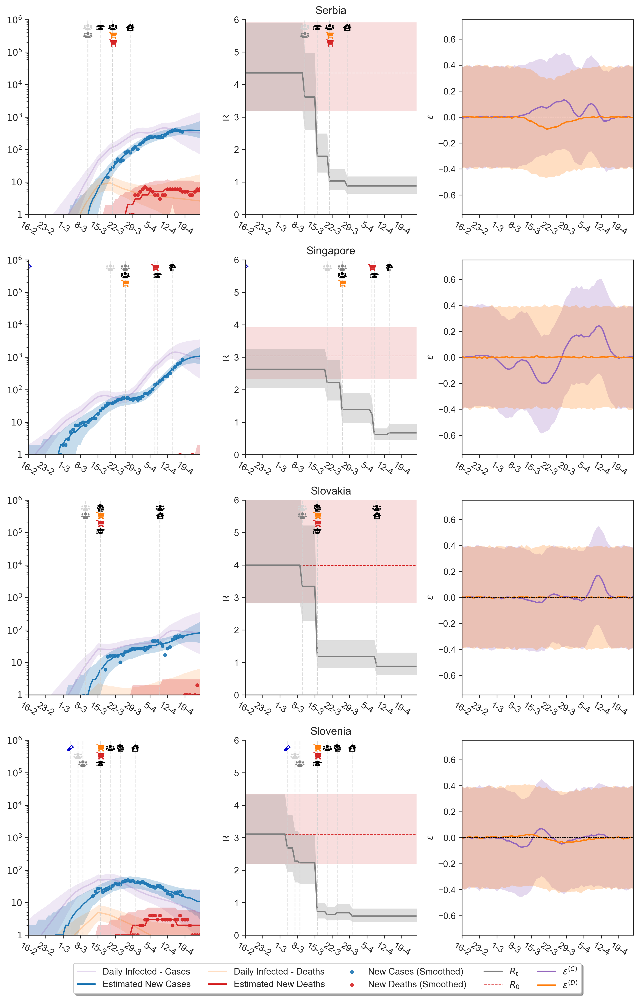

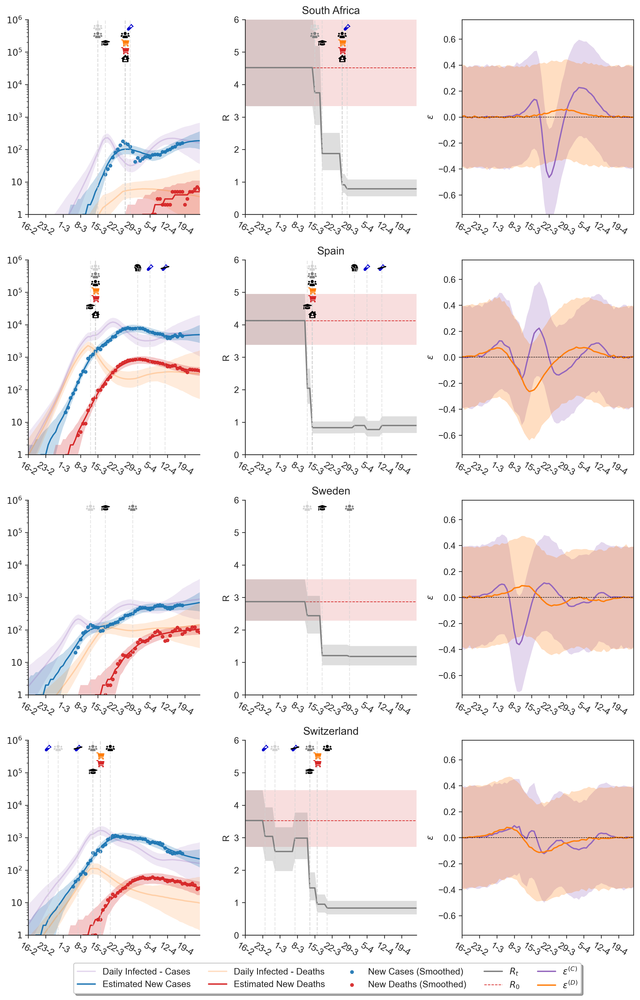

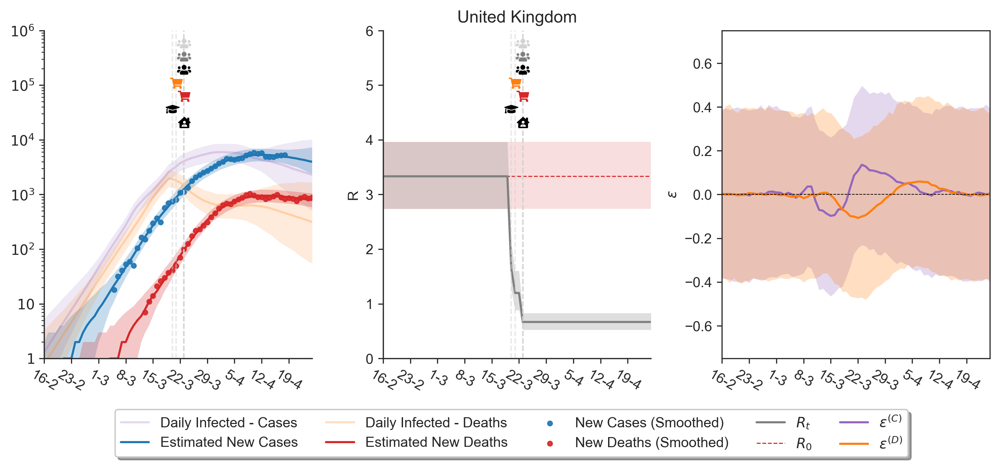

In [40]:
model.plot_subset_region_predictions(list(range(len(data.Rs))), model.cm_plot_style, fig_height=15, n_rows=4)

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 31-05;20-20


200.0


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/final_data/out at 31-05;20-20


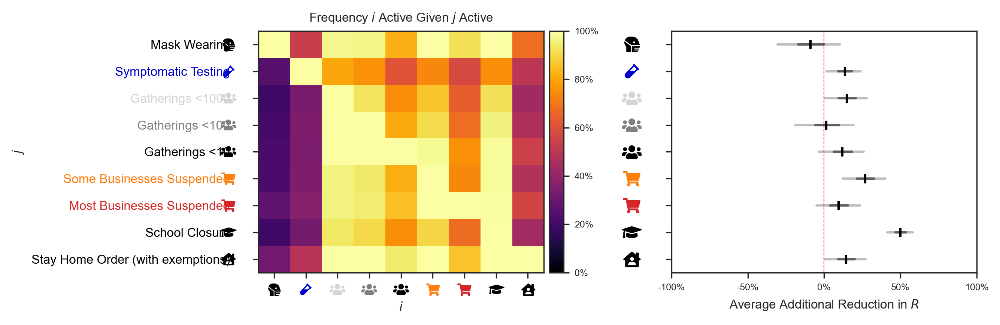

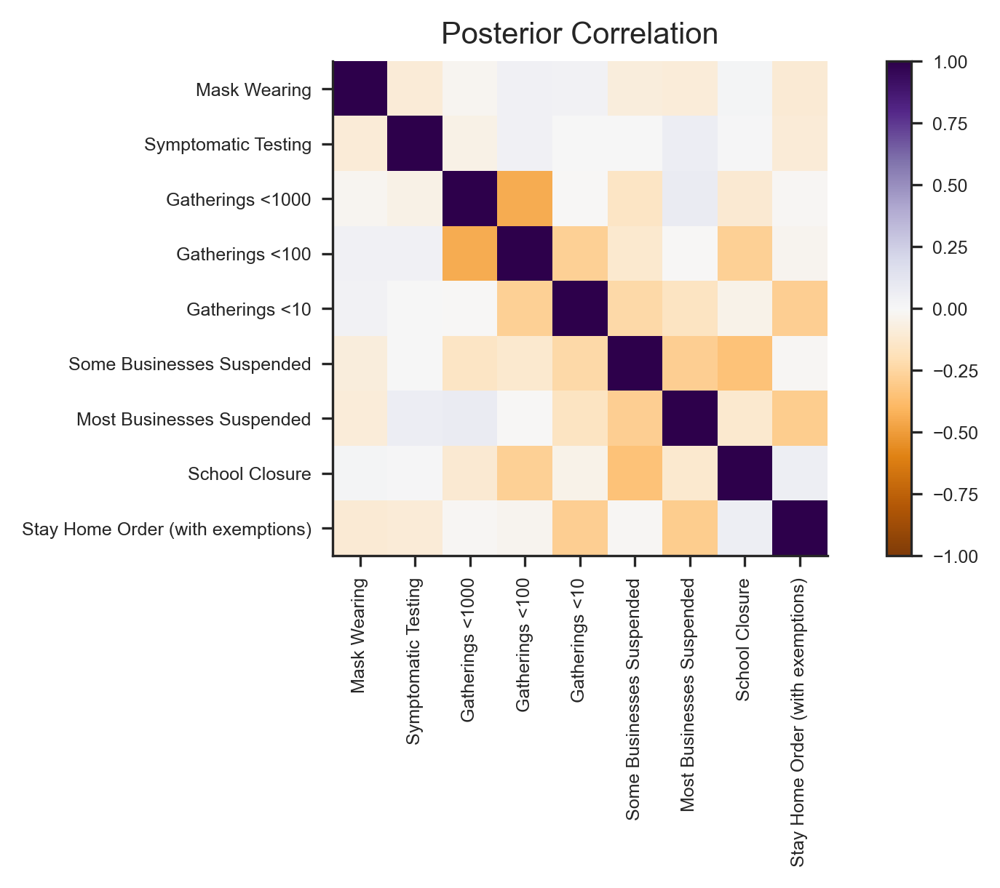

In [11]:
model.plot_effect()